## City of Charlotte CMPD Incidents Geospatial Mapping
In this notebook, I will similarly construct a dataframe to filter nad plot desired data of CMPD incidents.


In [42]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()
from datetime import datetime

import geopandas as gpd

from bokeh.io import output_file, show, output_notebook
from bokeh.models import ColumnDataSource, GMapOptions
from bokeh.plotting import gmap
import googlemaps

import plotly.express as px
import plotly.graph_objects as go


In [43]:
px.set_mapbox_access_token(open("mapbox_access_token.txt").read())

In [44]:
clt_df = pd.read_csv("CMPD_Incidents.csv")

<ipython-input-44-063591e129c2>:1: DtypeWarning:

Columns (7) have mixed types. Specify dtype option on import or set low_memory=False.



In [45]:
clt_df

,X,Y,YEAR,INCIDENT_REPORT_ID,LOCATION,CITY,STATE,ZIP,X_COORD_PUBLIC,Y_COORD_PUBLIC,...,PLACE_TYPE_DESCRIPTION,PLACE_DETAIL_DESCRIPTION,CLEARANCE_STATUS,CLEARANCE_DETAIL_STATUS,CLEARANCE_DATE,HIGHEST_NIBRS_CODE,HIGHEST_NIBRS_DESCRIPTION,OBJECTID,GlobalID,Shape
0,1.434366e+06,510280.999972,2022,20220525-2224-03,8900 NATIONS FORD RD,CHARLOTTE,NC,28217.0,1434366.0,510281.0,...,Retail,Gas Station,Open,Open,NaN,23C,Shoplifting,1,{0C990C2A-0F13-46E4-9937-C5FA221F9081},NaN
1,1.474590e+06,555400.999955,2022,20220525-2159-00,6000 MCDANIEL LN,CHARLOTTE,NC,28213.0,1474590.0,555401.0,...,Commercial Place,Other - Commercial Place,Open,Open,NaN,90Z,All Other Offenses,2,{9D2292F9-A006-44B4-B71B-27F3F7229A54},NaN
2,1.487113e+06,569706.999886,2022,20220525-2156-03,1900 CONIFER CR,CHARLOTTE,NC,28213.0,1487113.0,569707.0,...,Residential,Private Residence,Open,Open,NaN,802,Sudden/Natural Death Investigation,3,{415D1347-C2DE-4C06-A294-F9F5A6CE40BC},NaN
3,1.471201e+06,499005.999884,2022,20220525-2140-03,6800 SHANNOPIN DR,CHARLOTTE,NC,28270.0,1471201.0,499006.0,...,Residential,Apartment/Duplex Private Res,Open,Open,NaN,23H,All Other Thefts,4,{0D874F94-BE31-479F-8D26-735B50F5D06E},NaN
4,1.459367e+06,474107.000142,2022,20220525-2132-01,9600 REA RD,CHARLOTTE,NC,28277.0,1459367.0,474107.0,...,Retail,Gas Station,Open,Open,NaN,23C,Shoplifting,5,{ABE0D580-644E-4080-BEA8-1A80F0A48B33},NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
493969,1.482025e+06,542112.999956,2017,20170101-0025-07,4400 GAYNELLE DR,CHARLOTTE,NC,NaN,1482025.0,542113.0,...,Residential,Private Residence,Open,Open,NaN,13A,Aggravated Assault,493970,{D93B35B7-4CDB-4E8B-88D9-AE17B876D5E2},NaN
493970,1.433072e+06,554945.999881,2017,20170101-0014-05,1100 MARBLE ST,CHARLOTTE,NC,28208.0,1433072.0,554946.0,...,Residential,Apartment/Duplex Private Res,Open,Open,NaN,290,Damage/Vandalism Of Property,493971,{10367103-945F-4C72-B2F5-713A6ACA2C67},NaN
493971,1.445993e+06,479096.000006,2017,20170101-0012-00,14800 BALLANTYNE VILLAGE WY,CHARLOTT,NC,28277.0,1445993.0,479096.0,...,Commercial Place,Bar/Tavern/Nightclub,Cleared by Arrest,Cleared by Arrest,2017/01/13 00:00:00+00,13B,Simple Assault,493972,{1A9ADF00-677B-4C12-A761-9DE9A12FE7AE},NaN
493972,1.449048e+06,555773.999865,2017,20170101-0011-00,2100 KENNESAW DR,CHARLOTTE,NC,28216.0,1449048.0,555774.0,...,Residential,Private Residence,Open,Open,NaN,290,Damage/Vandalism Of Property,493973,{3EE0BDB6-0A61-4E31-8809-F139E5C9DB7C},NaN


In [46]:
clt_df.describe()

,X,Y,YEAR,X_COORD_PUBLIC,Y_COORD_PUBLIC,LATITUDE_PUBLIC,LONGITUDE_PUBLIC,NPA,OBJECTID,Shape
count,4.763800e+05,476380.000000,493974.000000,4.763800e+05,476380.000000,476380.000000,476380.000000,493974.000000,493974.000000,0.0
mean,1.454094e+06,541332.356460,2019.192962,1.454094e+06,541332.356459,35.220412,-80.828026,206.000045,246987.500000,NaN
std,2.218722e+04,25098.966343,1.570324,2.218722e+04,25098.966343,0.609963,0.073954,124.938092,142598.155273,NaN
min,1.384875e+06,465419.000129,2017.000000,1.384875e+06,465419.000000,-80.963592,-81.055860,0.000000,1.000000,NaN
25%,1.438495e+06,525648.000078,2018.000000,1.438495e+06,525648.000000,35.180109,-80.880081,96.000000,123494.250000,NaN
50%,1.452375e+06,542037.000108,2019.000000,1.452375e+06,542037.000000,35.225467,-80.833618,199.000000,246987.500000,NaN
75%,1.472142e+06,558041.999922,2021.000000,1.472142e+06,558042.000000,35.269438,-80.768242,331.000000,370480.750000,NaN
max,1.535404e+06,645111.999995,2022.000000,1.535404e+06,645112.000000,35.508584,-80.555365,475.000000,493974.000000,NaN


In [47]:
clt_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 493974 entries, 0 to 493973
Data columns (total 30 columns):
 #   Column                     Non-Null Count   Dtype  
---  ------                     --------------   -----  
 0   X                          476380 non-null  float64
 1   Y                          476380 non-null  float64
 2   YEAR                       493974 non-null  int64  
 3   INCIDENT_REPORT_ID         493974 non-null  object 
 4   LOCATION                   493974 non-null  object 
 5   CITY                       493974 non-null  object 
 6   STATE                      493971 non-null  object 
 7   ZIP                        342716 non-null  object 
 8   X_COORD_PUBLIC             476380 non-null  float64
 9   Y_COORD_PUBLIC             476380 non-null  float64
 10  LATITUDE_PUBLIC            476380 non-null  float64
 11  LONGITUDE_PUBLIC           476380 non-null  float64
 12  DIVISION_ID                493974 non-null  object 
 13  CMPD_PATROL_DIVISION       49

Let's look at all the possible incident types:

In [48]:
clt_df['HIGHEST_NIBRS_DESCRIPTION'].value_counts()

All Other Offenses             50204
Theft From Motor Vehicle       49767
Other Unlisted Non-Criminal    44831
Simple Assault                 42884
All Other Thefts               41828
                               ...  
Betting/Wagering                   3
Purchasing Prostitution            2
Assisting Gambling                 1
Gas Leak                           1
Bribery                            1
Name: HIGHEST_NIBRS_DESCRIPTION, Length: 72, dtype: int64

In [49]:
clt_df['PLACE_TYPE_DESCRIPTION'].value_counts() #Good column to filter down as well

Residential               229575
Open Area                  80330
Commercial Place           77816
Retail                     77039
Public/Non-Residential     29214
Name: PLACE_TYPE_DESCRIPTION, dtype: int64

To ensure unique records are plotted, let's ensure the rows equate to unique incidents.

In [50]:
print(f"We have {clt_df['INCIDENT_REPORT_ID'].nunique()} in our dataframe of size {clt_df.shape[0]}")

We have 493971 in our dataframe of size 493974


It seems we only have a few duplicate records with a non-unique record.

In order to narrow down date ranges, let's look at how we can do that with the date columns provided.

In [51]:
clt_df[['DATE_REPORTED', 'DATE_INCIDENT_BEGAN', 'DATE_INCIDENT_END']].iloc[50:100]

,DATE_REPORTED,DATE_INCIDENT_BEGAN,DATE_INCIDENT_END
50,2022/05/25 00:00:00+00,2022/05/25 00:00:00+00,NaN
51,2022/05/25 00:00:00+00,2022/05/24 00:00:00+00,2022/05/24 00:00:00+00
52,2022/05/25 00:00:00+00,2022/05/25 00:00:00+00,NaN
53,2022/05/25 00:00:00+00,2022/05/25 00:00:00+00,NaN
54,2022/05/25 00:00:00+00,2022/04/26 00:00:00+00,2022/05/19 00:00:00+00
55,2022/05/25 00:00:00+00,2022/05/25 00:00:00+00,2022/05/25 00:00:00+00
56,2022/05/25 00:00:00+00,2022/05/23 00:00:00+00,2022/05/24 00:00:00+00
57,2022/05/25 00:00:00+00,2022/05/19 00:00:00+00,2022/05/19 00:00:00+00
58,2022/05/25 00:00:00+00,2022/05/25 00:00:00+00,2022/05/25 00:00:00+00
59,2022/05/25 00:00:00+00,2022/05/25 00:00:00+00,2022/05/25 00:00:00+00


It appears the date reported column is likely the date the record was uploaded to the dataframe. Since most reocrds may have an unresolved incidence, we can filter the date of records by the date the incident began.

In [52]:
clt_df[clt_df['DATE_INCIDENT_BEGAN']<='2000-01-01'].shape

(104, 30)

In [53]:
print(clt_df['DATE_INCIDENT_BEGAN'].min())
print(clt_df['DATE_INCIDENT_BEGAN'].max())

0200/01/30 00:00:00+00
2022/05/25 00:00:00+00


In [54]:
clt_df[clt_df['DATE_INCIDENT_BEGAN'].between('2021-01-01', '2022-01-01')].shape

(87793, 30)

In [55]:
fil_clt_df = clt_df[clt_df['DATE_INCIDENT_BEGAN'].between('2021-01-01', '2022-01-01')]



fig = px.scatter_mapbox(fil_clt_df, lat="LATITUDE_PUBLIC", lon="LONGITUDE_PUBLIC",  
                  color_continuous_scale=px.colors.cyclical.IceFire, size_max=15, zoom=10)
fig.show()

Filtering the data down to a single year still returns a very dense view. We can also add a color filter by incident or place type.

In [56]:
fil_clt_df = clt_df[clt_df['DATE_INCIDENT_BEGAN'].between('2021-01-01', '2022-01-01')]

#df = px.data.carshare()
fig = px.scatter_mapbox(fil_clt_df, lat="LATITUDE_PUBLIC", lon="LONGITUDE_PUBLIC", color='PLACE_TYPE_DESCRIPTION',  
                  color_continuous_scale=px.colors.cyclical.IceFire, size_max=15, zoom=10)
fig.show()

Now let's try offense type. In our Streamlit app, we can also allow the user to choose which categories are included.

In [57]:
fil_clt_df = clt_df[clt_df['DATE_INCIDENT_BEGAN'].between('2021-01-01', '2022-01-01')]


fig = px.scatter_mapbox(fil_clt_df, lat="LATITUDE_PUBLIC", lon="LONGITUDE_PUBLIC", color='HIGHEST_NIBRS_DESCRIPTION',  
                  color_continuous_scale=px.colors.cyclical.IceFire, size_max=15, zoom=10)
fig.show()

CMPD Division is also included in the data. Since just providing a color filter for a categorical attribute and even narrowing down the dates still returns a very dense graph.

Since I believe there is an error where in some record the year is 200, I will export a truncated dataframe to only dates coming after the year 2000.

In [58]:
truncated_clt_df = clt_df[clt_df['DATE_INCIDENT_BEGAN']>='2000-01-01'].copy()

In [64]:
truncated_clt_df = truncated_clt_df[truncated_clt_df['STATE']=='NC'] #We only want records in North Carolina

In [65]:
truncated_clt_df['CMPD_PATROL_DIVISION'].unique()

array(['Steele Creek', 'North Tryon', 'University City', 'South', 'North',
       'Freedom', 'Central', 'Hickory Grove', 'Providence',
       'Independence', 'Metro', 'Westover', 'Eastway', 'Airport', nan,
       'Huntersville', 'Davidson', 'Unknown'], dtype=object)

In [66]:
truncated_clt_df['DATE_INCIDENT_BEGAN'].min()

'2000/01/01 00:00:00+00'

In [67]:
truncated_clt_df.to_csv("trunc_cmpd_incidents.csv")

### EDA
To try and discover anything interesting in the data, let's explore some aspects of it.

In [68]:
truncated_clt_df.describe()

,X,Y,YEAR,X_COORD_PUBLIC,Y_COORD_PUBLIC,LATITUDE_PUBLIC,LONGITUDE_PUBLIC,NPA,OBJECTID,Shape
count,4.762680e+05,476268.000000,493860.000000,4.762680e+05,476268.000000,476268.000000,476268.000000,493860.000000,493860.000000,0.0
mean,1.454094e+06,541332.539197,2019.192868,1.454094e+06,541332.539196,35.220412,-80.828024,205.997805,246996.986529,NaN
std,2.218674e+04,25099.380093,1.570319,2.218674e+04,25099.380094,0.610034,0.073952,124.937829,142597.600125,NaN
min,1.384875e+06,465419.000129,2017.000000,1.384875e+06,465419.000000,-80.963592,-81.055860,0.000000,1.000000,NaN
25%,1.438495e+06,525648.000078,2018.000000,1.438495e+06,525648.000000,35.180109,-80.880081,96.000000,123511.750000,NaN
50%,1.452376e+06,542037.000108,2019.000000,1.452376e+06,542037.000000,35.225467,-80.833609,199.000000,247003.500000,NaN
75%,1.472142e+06,558041.999922,2021.000000,1.472142e+06,558042.000000,35.269438,-80.768242,331.000000,370487.250000,NaN
max,1.535404e+06,645111.999995,2022.000000,1.535404e+06,645112.000000,35.508584,-80.555365,475.000000,493974.000000,NaN


In [69]:
truncated_clt_df.columns

Index(['X', 'Y', 'YEAR', 'INCIDENT_REPORT_ID', 'LOCATION', 'CITY', 'STATE',
       'ZIP', 'X_COORD_PUBLIC', 'Y_COORD_PUBLIC', 'LATITUDE_PUBLIC',
       'LONGITUDE_PUBLIC', 'DIVISION_ID', 'CMPD_PATROL_DIVISION', 'NPA',
       'DATE_REPORTED', 'DATE_INCIDENT_BEGAN', 'DATE_INCIDENT_END',
       'ADDRESS_DESCRIPTION', 'LOCATION_TYPE_DESCRIPTION',
       'PLACE_TYPE_DESCRIPTION', 'PLACE_DETAIL_DESCRIPTION',
       'CLEARANCE_STATUS', 'CLEARANCE_DETAIL_STATUS', 'CLEARANCE_DATE',
       'HIGHEST_NIBRS_CODE', 'HIGHEST_NIBRS_DESCRIPTION', 'OBJECTID',
       'GlobalID', 'Shape'],
      dtype='object')

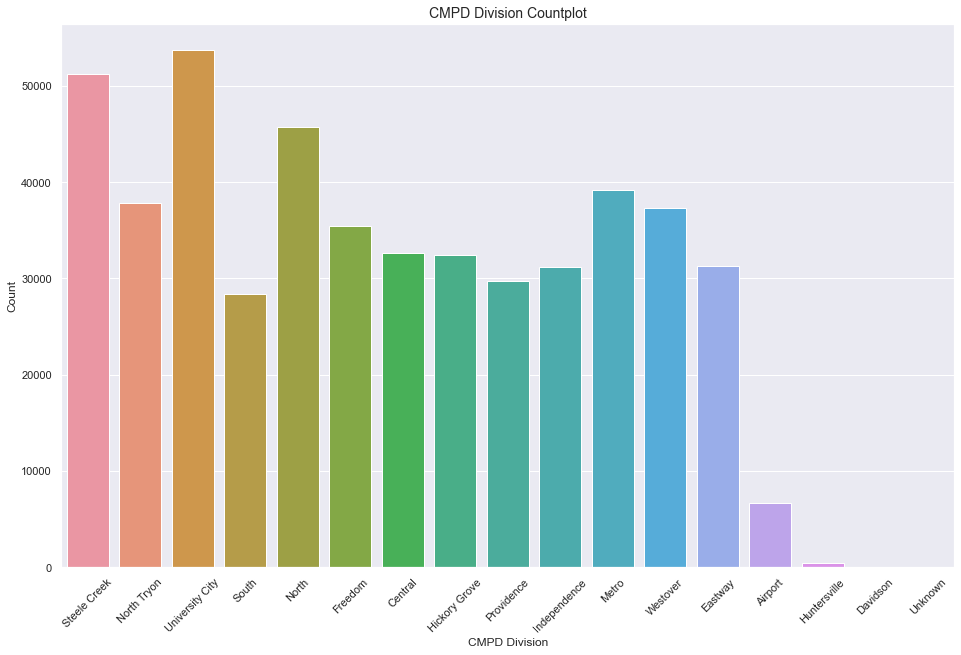

In [76]:
plt.figure(figsize=(16,10))
sns.countplot(x='CMPD_PATROL_DIVISION', data=truncated_clt_df)
plt.xticks(rotation=45)
plt.title("CMPD Division Countplot", fontsize=14)
plt.xlabel("CMPD Division")
plt.ylabel("Count")
plt.show()

It seems some divisions within the city have more records than others.

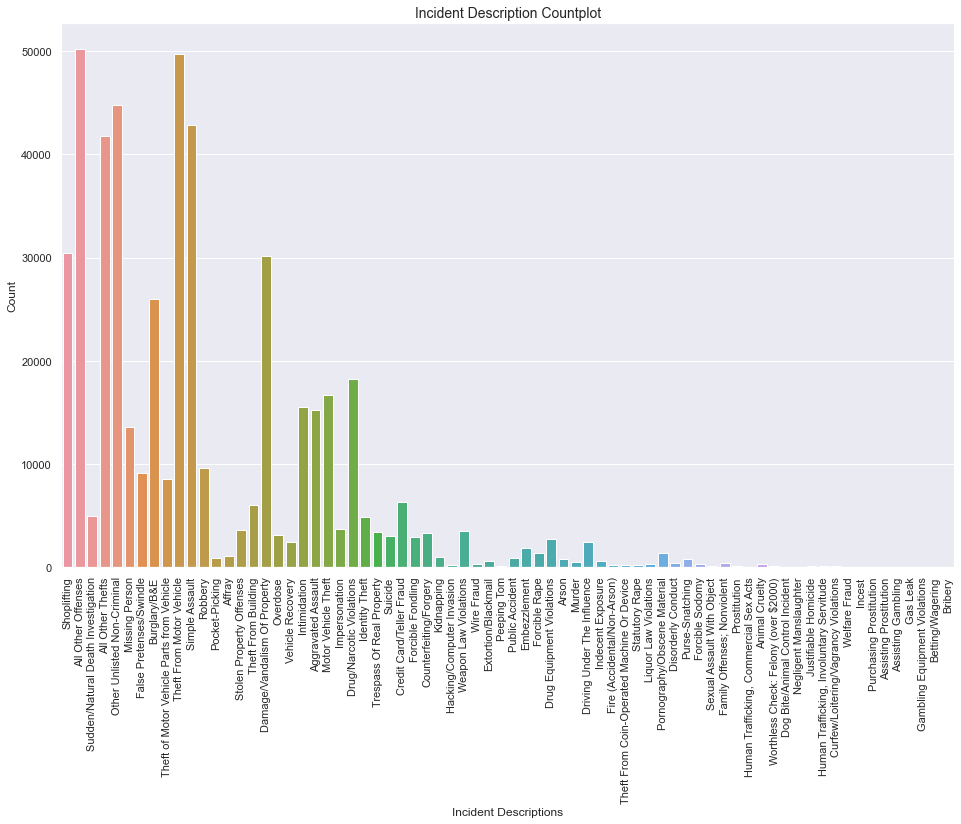

In [77]:
plt.figure(figsize=(16,10))
sns.countplot(x='HIGHEST_NIBRS_DESCRIPTION', data=truncated_clt_df)
plt.xticks(rotation=90)
plt.title("Incident Description Countplot", fontsize=14)
plt.xlabel("Incident Descriptions")
plt.ylabel("Count")
plt.show()

Shoplifting and theft from a vehicle are the most common offenses. 

Let's make a line chart of the number of records for each date.

In [83]:
counts_df = truncated_clt_df.groupby('DATE_INCIDENT_BEGAN').agg({'INCIDENT_REPORT_ID':'count'})

In [90]:
figure = px.line(counts_df, width=1200, height=600, title='CMPD Incidents over Time', labels={'DATE_INCIDENT_BEGAN':'Date', 'value':'Count'})
figure.show()

It appears the city didn't start tracking data as sedulously since 2017. Of course we can see the dip in incidents around the time COVID-19 landed in the USA.

What were the top locations/addresses where incidents took place?

In [91]:
truncated_clt_df['LOCATION'].unique()

array(['8900 NATIONS FORD RD', '6000 MCDANIEL LN', '1900 CONIFER CR', ...,
       '2000 W BROOKSHIRE BV', '1600 E WOODLAWN RD 210',
       '4400 FOX BROOK LN'], dtype=object)

In [99]:
truncated_clt_df.groupby('LOCATION').agg({'INCIDENT_REPORT_ID':'count'}).sort_values(by='INCIDENT_REPORT_ID', ascending=False)[:15]

,INCIDENT_REPORT_ID
LOCATION,
5500 JOSH BIRMINGHAM PY,4946
4400 SHARON RD,2323
6800 NORTHLAKE MALL DR,1683
7700 N TRYON ST,1673
8100 S TRYON ST,1512
9500 SOUTH BV,1412
200 E TRADE ST,1324
600 E TRADE ST,1272
3200 WILKINSON BV,1254


The first location comes near Clt. Airport, and the second location is located at a popular shopping mall in the city. Given the most common offense was shoplifting, it makes sense the shopping mall is high on the list. However, I want to investigate the first address more closely.

In [103]:
truncated_clt_df[truncated_clt_df['LOCATION']=='5500 JOSH BIRMINGHAM PY'].groupby('HIGHEST_NIBRS_DESCRIPTION').agg({'INCIDENT_REPORT_ID':'count'}).sort_values(by='INCIDENT_REPORT_ID', ascending=False)

,INCIDENT_REPORT_ID
HIGHEST_NIBRS_DESCRIPTION,
Other Unlisted Non-Criminal,1769
All Other Thefts,1033
Drug/Narcotic Violations,648
Weapon Law Violations,321
All Other Offenses,267
Simple Assault,181
Disorderly Conduct,89
Trespass Of Real Property,72
Damage/Vandalism Of Property,69


There seems to be a wide array of crimes that are committed here. It's interesting this location has so many more incidents than even the 2nd most common location.